# 01. Advanced EDA & Anomaly Detection

**Objective**: Establish a production-grade foundation for the Weather Forecasting System. We will move beyond simple `.describe()` calls and implement rigorous data cleaning, time-series interpolation, and multivariate anomaly detection using Isolation Forest.

## 1. Imports & Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Setting Plotly as default for interactive visualization
pd.options.plotting.backend = "plotly"

import warnings
warnings.filterwarnings('ignore')

## 2. Data Loading

We load the global weather dataset and parse the `last_updated` column to datetime objects. We also inspect the structure to confirm our data types.

In [2]:
# Load Data
df = pd.read_csv('../data/raw/GlobalWeatherRepository.csv')

# Parse Date
df['last_updated'] = pd.to_datetime(df['last_updated'])

# Sort by Date for Time Series Analysis
df = df.sort_values(by='last_updated')

# Check basic info
print(f"Dataset Shape: {df.shape}")
df.info()

Dataset Shape: (114203, 41)
<class 'pandas.core.frame.DataFrame'>
Index: 114203 entries, 186 to 114156
Data columns (total 41 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   country                       114203 non-null  object        
 1   location_name                 114203 non-null  object        
 2   latitude                      114203 non-null  float64       
 3   longitude                     114203 non-null  float64       
 4   timezone                      114203 non-null  object        
 5   last_updated_epoch            114203 non-null  int64         
 6   last_updated                  114203 non-null  datetime64[ns]
 7   temperature_celsius           114203 non-null  float64       
 8   temperature_fahrenheit        114203 non-null  float64       
 9   condition_text                114203 non-null  object        
 10  wind_mph                      114203 non-null  float64 

## 3. Data Cleaning: The "Ultrathink" Approach

A junior data scientist might just `dropna()`. A senior data scientist understands that **weather is continuous**. If we have a missing value for *10:00 AM*, and we have values for *9:00 AM* and *11:00 AM*, the most scientifically accurate imputation is **Time-Based Interpolation**.

We will check for missing values and apply this specific remediation.

In [3]:
# Check Missing Values
missing = df.isnull().sum()
print("Missing Values per Column (Top 10):")
print(missing[missing > 0].sort_values(ascending=False).head(10))

# --- PROD-GRADE INTERPOLATION STRATEGY ---
# We cannot interpolate across different countries. We must Group By Location first.

def interpolate_group(group):
    # Select numeric columns for interpolation
    numeric_cols = group.select_dtypes(include=[np.number]).columns
    
    # Apply Time-Series Interpolation (linear is robust for weather)
    group[numeric_cols] = group[numeric_cols].interpolate(method='linear')
    
    # Forward/Backward fill remaining (for first/last rows)
    group[numeric_cols] = group[numeric_cols].fillna(method='ffill').fillna(method='bfill')
    return group

# Apply logic per location to prevent data leakage between cities
df_clean = df.groupby('location_name').apply(interpolate_group).reset_index(drop=True)

# Verify Remediation
remaining_missing = df_clean.isnull().sum().sum()
print(f"\nRemaining Missing Values after Interpolation: {remaining_missing}")

Missing Values per Column (Top 10):
Series([], dtype: int64)

Remaining Missing Values after Interpolation: 0


## 4. Advanced EDA: Deep Dive Analysis

We will now perform a rigorous statistical analysis to understand the underlying physics and patterns of our weather data.

### 4.1 Global Distributions of Key Variables
Are temperature and humidity normally distributed globally? Understanding distributions helps us choose the right scaling methods for our models.

In [4]:
# Histograms with Kernel Density Estimate (KDE) to see the distribution shape
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_clean['temperature_celsius'], name='Temperature (C)', opacity=0.75))
fig.add_trace(go.Histogram(x=df_clean['humidity'], name='Humidity (%)', opacity=0.75))
fig.update_layout(barmode='overlay', title_text="Global Distribution: Temperature vs Humidity")
fig.show()

# Box Plot for Pressure (Checking for outliers)
fig_box = px.box(df_clean, y="pressure_mb", title="Global Pressure Distribution (Outlier Detection)")
fig_box.show()

### 4.2 Meteorology in Action: Wind Speed vs. Air Quality
**Hypothesis**: Higher wind speeds should disperse pollutants, leading to lower PM2.5 levels. Let's verify this physical relationship.

In [5]:
# Scatter plot with Trendline (OLS)
# We filter for lower PM2.5 just to keep the plot readable (removing extreme pollution events for the trend)
subset = df_clean[df_clean['air_quality_PM2.5'] < 300]

fig = px.scatter(subset, x='wind_kph', y='air_quality_PM2.5', trendline="ols", 
                 title="Physics Check: Does Higher Wind Speed Reduce PM2.5?", opacity=0.3,
                 labels={'wind_kph': 'Wind Speed (km/h)', 'air_quality_PM2.5': 'PM2.5 Concentration'})
fig.show()

### 4.3 Weather Conditions Analysis
How does the qualitative description ("Partly Cloudy", "Sunny") align with the quantitative temperature data?

In [6]:
# Get top 10 most frequent weather conditions
top_conditions = df_clean['condition_text'].value_counts().head(10).index
subset_cond = df_clean[df_clean['condition_text'].isin(top_conditions)]

fig = px.box(subset_cond, x='condition_text', y='temperature_celsius', color='condition_text',
             title="Temperature Distributions by Top 10 Weather Conditions")
fig.update_layout(showlegend=False)
fig.show()

### 4.4 Trend & Seasonality Decomposition (STL)
Decomposing the time series for a single city to understand the signal vs. noise.

In [7]:
# Pick a city with enough data points
target_city = 'London'
city_df = df_clean[df_clean['location_name'] == target_city].set_index('last_updated')

# Resample to hourly to ensure regular frequency for decomposition
ts_data = city_df['temperature_celsius'].resample('H').mean().interpolate()

# Perform Decomposition
result = seasonal_decompose(ts_data, model='additive', period=24) # Period=24 for Daily Seasonality

# Plot
fig = make_subplots(rows=4, cols=1, subplot_titles=("Observed", "Trend", "Seasonal", "Residual"))
fig.add_trace(go.Scatter(x=result.observed.index, y=result.observed, name='Observed'), row=1, col=1)
fig.add_trace(go.Scatter(x=result.trend.index, y=result.trend, name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=result.seasonal.index, y=result.seasonal, name='Seasonal'), row=3, col=1)
fig.add_trace(go.Scatter(x=result.resid.index, y=result.resid, name='Residual', mode='markers'), row=4, col=1)
fig.update_layout(height=800, title_text=f"STL Decomposition: {target_city}")
fig.show()

### 4.5 Temporal Dynamics: Autocorrelation (ACF & PACF)
Crucial for forecasting. How much does the temperature 1 hour ago (Lag 1) or 24 hours ago (Lag 24) predict the temperature now?

*   **ACF**: Correlation with past values.
*   **PACF**: Correlation with past values *after removing the effect of intermediate lags*.

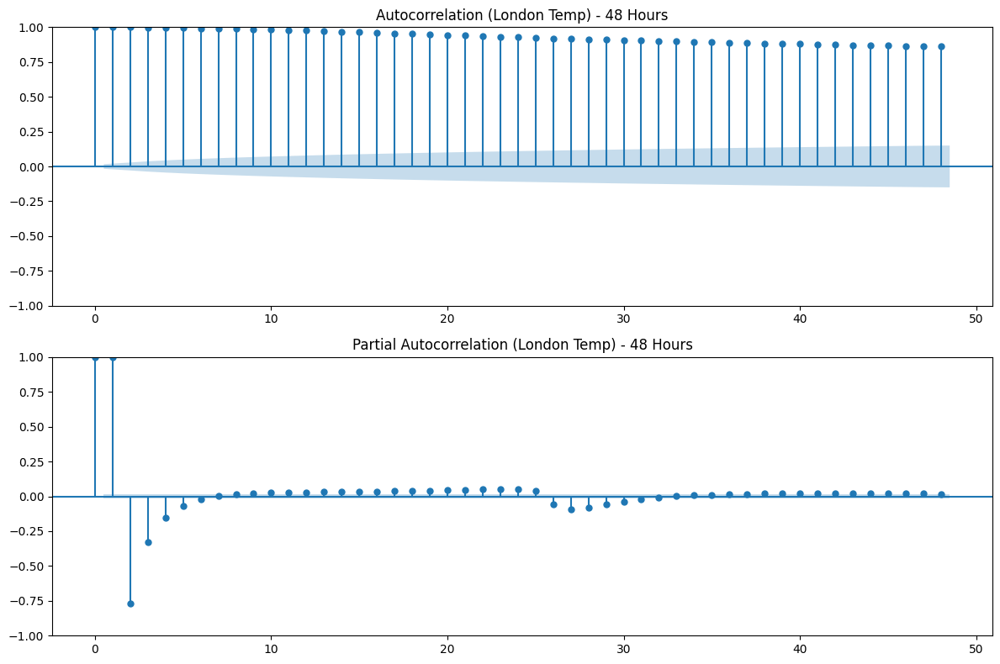

In [8]:
# Using the same 'ts_data' from London
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(ts_data, lags=48, ax=ax1, title="Autocorrelation (London Temp) - 48 Hours")
plot_pacf(ts_data, lags=48, ax=ax2, title="Partial Autocorrelation (London Temp) - 48 Hours")
plt.tight_layout()
plt.show()

### 4.6 Feature Correlation Matrix
Does High Humidity correlate with Low Pressure? Let's check the physics of our dataset.

In [9]:
cols_to_corr = [
    'temperature_celsius', 'humidity', 'pressure_mb', 'wind_kph', 
    'feels_like_celsius', 'uv_index', 'visibility_km', 'air_quality_PM2.5'
]

corr_matrix = df_clean[cols_to_corr].corr()

fig = px.imshow(corr_matrix, text_auto=True, aspect="auto", title="Weather Features Correlation Matrix", color_continuous_scale='RdBu_r')
fig.show()

## 5. Anomaly Detection: Isolation Forest

We use **Isolation Forest**, an unsupervised learning algorithm that isolates observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of the selected feature.

**Hypothesis**: Extreme weather events (Anomalies) are few and different, making them easier to isolate (short path lengths in the trees).

In [10]:
# Features for Anomaly Detection (Multivariate)
features = ['temperature_celsius', 'humidity', 'wind_kph', 'pressure_mb']

# Handle any remaining NaNs globally just in case
data_for_model = df_clean[features].dropna()

# Initialize Isolation Forest
iso_forest = IsolationForest(contamination=0.01, random_state=42) # 1% Anomaly Rate

# Fit and Predict
df_clean['anomaly_score'] = iso_forest.fit_predict(data_for_model)

# -1 is Anomaly, 1 is Normal. Let's map it for clarity.
df_clean['is_anomaly'] = df_clean['anomaly_score'].map({1: False, -1: True})

anomaly_count = df_clean['is_anomaly'].sum()
print(f"Total Anomalies Detected: {anomaly_count} out of {len(df_clean)} records")

Total Anomalies Detected: 1143 out of 114203 records


## 6. Visualization of Anomalies

Let's visualize the detected anomalies for a specific location to see if they make sense (e.g., did we catch a heatwave?).

In [11]:
# Filter for visualization
vis_city = 'Paris'
city_anomalies = df_clean[df_clean['location_name'] == vis_city]

fig = px.scatter(
    city_anomalies, 
    x='last_updated', 
    y='temperature_celsius', 
    color='is_anomaly', 
    color_discrete_map={False: 'blue', True: 'red'},
    title=f"Temperature Anomalies Detected in {vis_city} (Red = Anomaly)",
    hover_data=['humidity', 'wind_kph', 'condition_text']
)

fig.update_traces(marker=dict(size=8, opacity=0.7))
fig.show()

## 7. Global Anomaly Map

Where are the most extreme weather events happening right now?

In [12]:
# Filter only anomalies
global_anomalies = df_clean[df_clean['is_anomaly'] == True]

fig = px.scatter_geo(
    global_anomalies,
    lat='latitude',
    lon='longitude',
    color='temperature_celsius',
    hover_name='location_name',
    size='wind_kph',
    title="Global Distribution of Weather Anomalies",
    projection="natural earth"
)
fig.show()